In [1]:
# Import Libraries
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
from pathlib import Path
import sys
import finta
import plotly.graph_objects as go

In [6]:
# Function to Plot Bollinger Bands and Locate Intersections
def plot_bollinger_bands(stock_symbol):
    # Download historical data for the specified stock symbol
    df = yf.download(stock_symbol, start="2015-01-01", end="2023-06-07")

    # Define Bollinger Bands function
    def bollinger_bands(data, n, std, col='Close'):
        MA = data[col].rolling(window=n).mean()
        SD = data[col].rolling(window=n).std()
        data['BB_Upper'] = MA + (std * SD)
        data['BB_Lower'] = MA - (std * SD)
        return data

    # Compute Bollinger Bands with std dev of 1 and 3
    df = bollinger_bands(df, n=200, std=1)
    df.rename(columns={'BB_Upper': 'BB_Upper1', 'BB_Lower': 'BB_Lower1'}, inplace=True)
    df = bollinger_bands(df, n=200, std=2)
    df.rename(columns={'BB_Upper': 'BB_Upper2', 'BB_Lower': 'BB_Lower2'}, inplace=True)

    # Compute EMA
    df['EMA_200'] = df['Close'].ewm(span=200, adjust=False).mean()

    # Create a Candlestick chart
    trace_candle = go.Candlestick(x=df.index,
                                 open=df['Open'],
                                 high=df['High'],
                                 low=df['Low'],
                                 close=df['Close'], name='Candlestick')

    # Create traces for Bollinger Bands, SMAs, EMA
    trace_bb_upper1 = go.Scatter(x=df.index, y=df['BB_Upper1'], line={'color': 'red'}, name='BB Upper 1')
    trace_bb_lower1 = go.Scatter(x=df.index, y=df['BB_Lower1'], line={'color': 'red'}, name='BB Lower 1')
    trace_bb_upper3 = go.Scatter(x=df.index, y=df['BB_Upper2'], line={'color': 'blue'}, name='BB Upper 2')
    trace_bb_lower3 = go.Scatter(x=df.index, y=df['BB_Lower2'], line={'color': 'blue'}, name='BB Lower 2')
    trace_ema_200 = go.Scatter(x=df.index, y=df['EMA_200'], line={'color': 'yellow'}, name='EMA 200')

    # Create layout
    layout = go.Layout(title=f'{stock_symbol} Bollinger Bands and EMA 200',
                       xaxis=dict(title="Date"),
                       yaxis=dict(title="Price"),
                       width=1200,
                       height=800)

    # Create figure and add traces
    fig = go.Figure(data=[trace_candle, trace_bb_upper1, trace_bb_lower1, trace_bb_upper3, trace_bb_lower3, trace_ema_200], layout=layout)
    
    # Determine entry and exit points
    entry_points_BB = []
    exit_points_BB = []

    for i in range(1, len(df)):
        if df['Close'][i] < df['BB_Lower2'][i] and df['Close'][i-1] >= df['BB_Lower2'][i-1]:
            entry_points_BB.append((df.index[i].date(), round(df['Close'][i], 2)))
        elif df['Close'][i] > df['BB_Upper2'][i] and df['Close'][i-1] <= df['BB_Upper2'][i-1]:
            exit_points_BB.append((df.index[i].date(), round(df['Close'][i], 2)))

    # Print entry and exit points
    print("Entry Points:")
    for entry in entry_points_BB:
        print(f"Date: {entry[0]}, Price: {entry[1]}")

    print("\nExit Points:")
    for exit in exit_points_BB:
        print(f"Date: {exit[0]}, Price: {exit[1]}")

    # Show the figure
    fig.show()

In [7]:
# Function to Plot SMA and Locate Intersections
def plot_SMA(stock_symbol):
    # Download historical data for the specified stock symbol
    df = yf.download(stock_symbol, start="2015-01-01", end="2023-06-07")

    # Compute SMAs
    df['SMA_9'] = df['Close'].rolling(window=9).mean()
    df['SMA_21'] = df['Close'].rolling(window=21).mean()

    # Compute EMA
    df['EMA_200'] = df['Close'].ewm(span=200, adjust=False).mean()

    # Create a Candlestick chart
    trace_candle = go.Candlestick(x=df.index,
                    open=df['Open'],
                    high=df['High'],
                    low=df['Low'],
                    close=df['Close'], name='Candlestick')

    # Create traces for SMAs, EMA
    trace_sma_9 = go.Scatter(x=df.index, y=df['SMA_9'], line={'color': 'green'}, name='SMA 9')
    trace_sma_21 = go.Scatter(x=df.index, y=df['SMA_21'], line={'color': 'black'}, name='SMA 21')
    trace_ema_200 = go.Scatter(x=df.index, y=df['EMA_200'], line={'color': 'yellow'}, name='EMA 200')

    # Create layout
    layout = go.Layout(title= f'{stock_symbol} with SMAs and EMA 200',
                       xaxis=dict(title="Date"),
                       yaxis=dict(title="Price"),
                       width=1200,
                       height=800)

    # Create figure and add traces
    fig1 = go.Figure(data=[trace_candle, trace_sma_9, trace_sma_21, trace_ema_200], layout=layout)

    # Determine entry and exit points
    entry_points_SMA = []
    exit_points_SMA = []

    for i in range(1, len(df)):
        if df['SMA_9'][i-1] < df['SMA_21'][i-1] and df['SMA_9'][i] > df['SMA_21'][i] and df['SMA_9'][i] > df['EMA_200'][i] and df['SMA_21'][i] > df['EMA_200'][i]:
            entry_points_SMA.append((df.index[i].date(), round(df['Close'][i], 2)))
        elif df['SMA_9'][i-1] > df['SMA_21'][i-1] and df['SMA_9'][i] < df['SMA_21'][i] and df['SMA_9'][i] < df['EMA_200'][i] and df['SMA_21'][i] < df['EMA_200'][i]:
            exit_points_SMA.append((df.index[i].date(), round(df['Close'][i], 2)))

    # Print entry and exit points
    print("Entry Points of SMA:")
    for entry in entry_points_SMA:
        print(f"Date: {entry[0]}, Price: {entry[1]}")

    print("Exit Points of SMA:")
    for exit in exit_points_SMA:
        print(f"Date: {exit[0]}, Price: {exit[1]}")

    # Show the figure
    fig1.show()

In [8]:
# Function to Plot MACD and Locate Intersections
def plot_MACD(stock_symbol):
    # Download historical data for the specified stock symbol
    df = yf.download(stock_symbol, start="2015-01-01", end="2023-06-07")

    # Compute MACD
    def compute_macd(data, short=12, long=26):
        short_ema = data.ewm(span=short, adjust=False).mean()
        long_ema = data.ewm(span=long, adjust=False).mean()
        macd = short_ema - long_ema
        signal = macd.ewm(span=9, adjust=False).mean()
        return macd, signal

    # Compute MACD and MACD Signal
    macd, macd_signal = compute_macd(df['Close'])

    # Create traces for MACD, MACD Signal, and zero line
    trace_macd = go.Scatter(x=df.index, y=macd, line={'color': 'cyan'}, name='MACD')
    trace_macd_signal = go.Scatter(x=df.index, y=macd_signal, line={'color': 'magenta'}, name='MACD Signal')
    trace_zero_line = go.Scatter(x=df.index, y=[0] * len(df), line={'color': 'black', 'dash': 'dash'}, name='Zero Line')
    
    # Create layout
    layout = go.Layout(
        title="MACD Indicator",
        xaxis=dict(title="Date"),
        yaxis=dict(title="MACD/Signal"),
        width=1200,
        height=800)

    # Create figure and add traces
    fig2 = go.Figure(data=[trace_macd, trace_macd_signal, trace_zero_line], layout=layout)

    # Determine entry and exit points
    entry_points_MACD = []
    exit_points_MACD = []

    for i in range(1, len(macd)):
        if macd[i-1] < macd_signal[i-1] and macd[i] > macd_signal[i]:
            entry_points_MACD.append((df.index[i].date(), round(df['Close'][i], 2)))
        elif macd[i-1] > macd_signal[i-1] and macd[i] < macd_signal[i]:
            exit_points_MACD.append((df.index[i].date(), round(df['Close'][i], 2)))

    # Print entry and exit points
    print("Entry Points of MACD:")
    for entry in entry_points_MACD:
        print(f"Date: {entry[0]}, Price: {entry[1]}")

    print("\nExit Points of MACD:")
    for exit in exit_points_MACD:
        print(f"Date: {exit[0]}, Price: {exit[1]}")

    # Show the figure
    fig2.show()


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Entry Points:
Date: 2018-03-27, Price: 152.22
Date: 2018-10-10, Price: 151.38
Date: 2018-10-24, Price: 146.04
Date: 2018-10-26, Price: 145.37
Date: 2018-11-12, Price: 141.55
Date: 2018-11-16, Price: 139.53
Date: 2018-12-21, Price: 124.95
Date: 2020-03-12, Price: 154.47
Date: 2020-03-16, Price: 146.01
Date: 2020-03-27, Price: 156.79
Date: 2020-04-01, Price: 159.6
Date: 2022-01-26, Price: 294.63
Date: 2022-02-03, Price: 237.76
Date: 2022-04-22, Price: 184.11
Date: 2022-04-27, Price: 174.95
Date: 2022-10-27, Price: 97.94

Exit Points:
Date: 2015-10-19, Price: 98.47
Date: 2015-10-22,

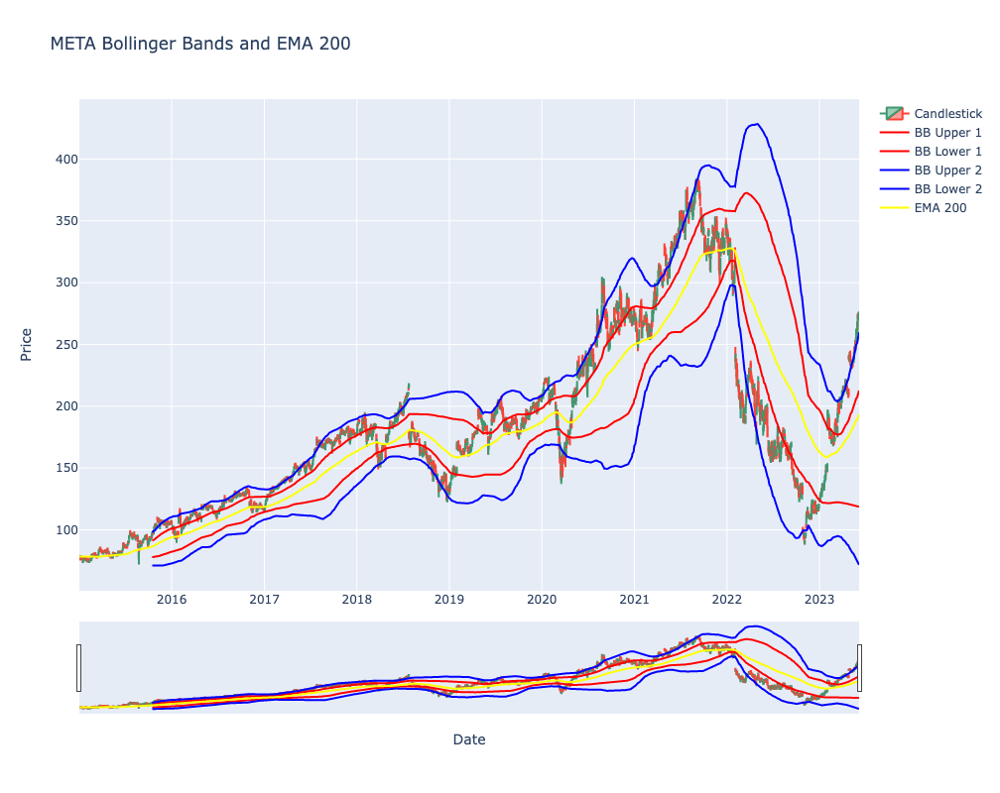

[*********************100%***********************]  1 of 1 completed
Entry Points of SMA:
Date: 2015-03-23, Price: 84.43
Date: 2015-04-22, Price: 84.63
Date: 2015-05-21, Price: 80.48
Date: 2015-09-14, Price: 92.31
Date: 2015-10-13, Price: 94.12
Date: 2015-12-28, Price: 105.93
Date: 2016-02-01, Price: 115.09
Date: 2016-03-01, Price: 109.82
Date: 2016-04-29, Price: 117.58
Date: 2016-06-06, Price: 118.79
Date: 2016-07-11, Price: 117.87
Date: 2016-08-29, Price: 126.54
Date: 2016-10-07, Price: 128.99
Date: 2016-10-19, Price: 130.11
Date: 2016-12-15, Price: 120.57
Date: 2017-01-10, Price: 124.35
Date: 2017-04-24, Price: 145.47
Date: 2017-06-01, Price: 151.53
Date: 2017-06-26, Price: 153.59
Date: 2017-07-13, Price: 159.26
Date: 2017-09-06, Price: 172.09
Date: 2017-10-10, Price: 171.59
Date: 2017-12-18, Price: 180.82
Date: 2018-01-26, Price: 190.0
Date: 2018-03-05, Price: 180.4
Date: 2019-03-06, Price: 172.51
Date: 2019-04-04, Price: 176.02
Date: 2019-06-19, Price: 187.48
Date: 2019-09-06, Pri

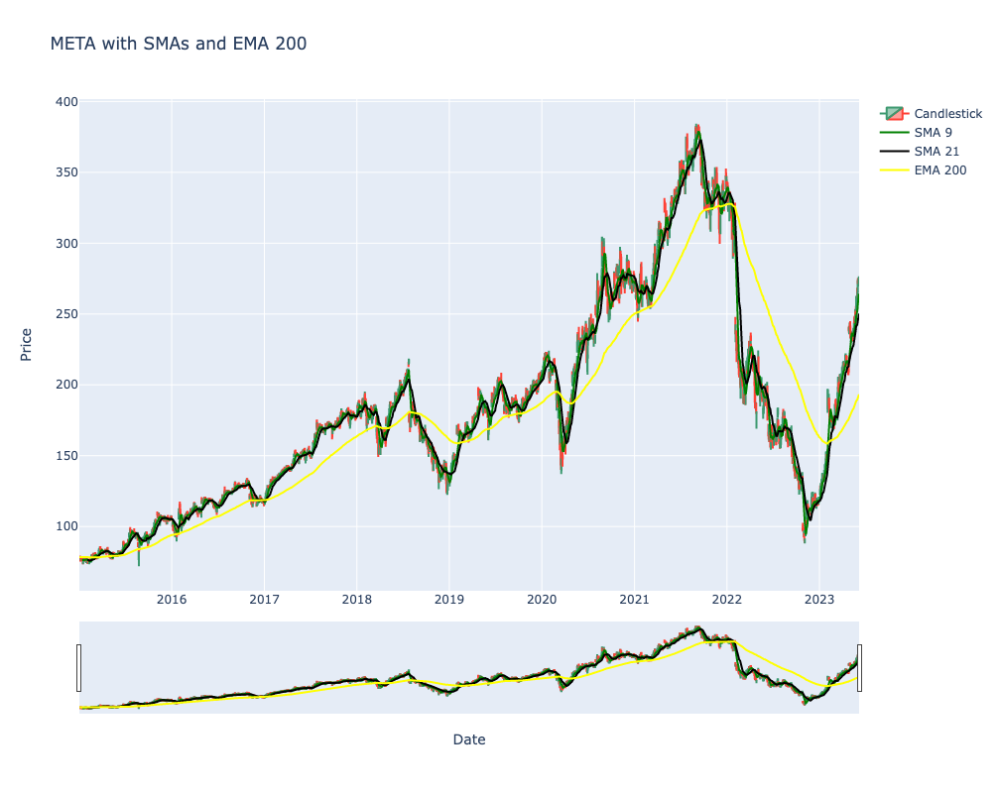

[*********************100%***********************]  1 of 1 completed
Entry Points of MACD:
Date: 2015-01-22, Price: 77.65
Date: 2015-02-11, Price: 76.51
Date: 2015-03-19, Price: 82.75
Date: 2015-04-22, Price: 84.63
Date: 2015-05-14, Price: 81.37
Date: 2015-07-13, Price: 90.1
Date: 2015-09-09, Price: 90.44
Date: 2015-10-06, Price: 92.8
Date: 2015-12-29, Price: 107.26
Date: 2016-01-28, Price: 109.11
Date: 2016-02-22, Price: 107.16
Date: 2016-03-14, Price: 109.89
Date: 2016-04-28, Price: 116.73
Date: 2016-07-05, Price: 114.2
Date: 2016-09-02, Price: 126.51
Date: 2016-10-21, Price: 132.07
Date: 2016-11-23, Price: 120.84
Date: 2016-12-06, Price: 117.31
Date: 2017-01-04, Price: 118.69
Date: 2017-02-09, Price: 134.14
Date: 2017-03-13, Price: 139.6
Date: 2017-03-29, Price: 142.65
Date: 2017-04-21, Price: 143.68
Date: 2017-05-30, Price: 152.38
Date: 2017-06-22, Price: 153.4
Date: 2017-07-11, Price: 155.27
Date: 2017-09-06, Price: 172.09
Date: 2017-10-06, Price: 172.23
Date: 2017-10-30, Price: 1

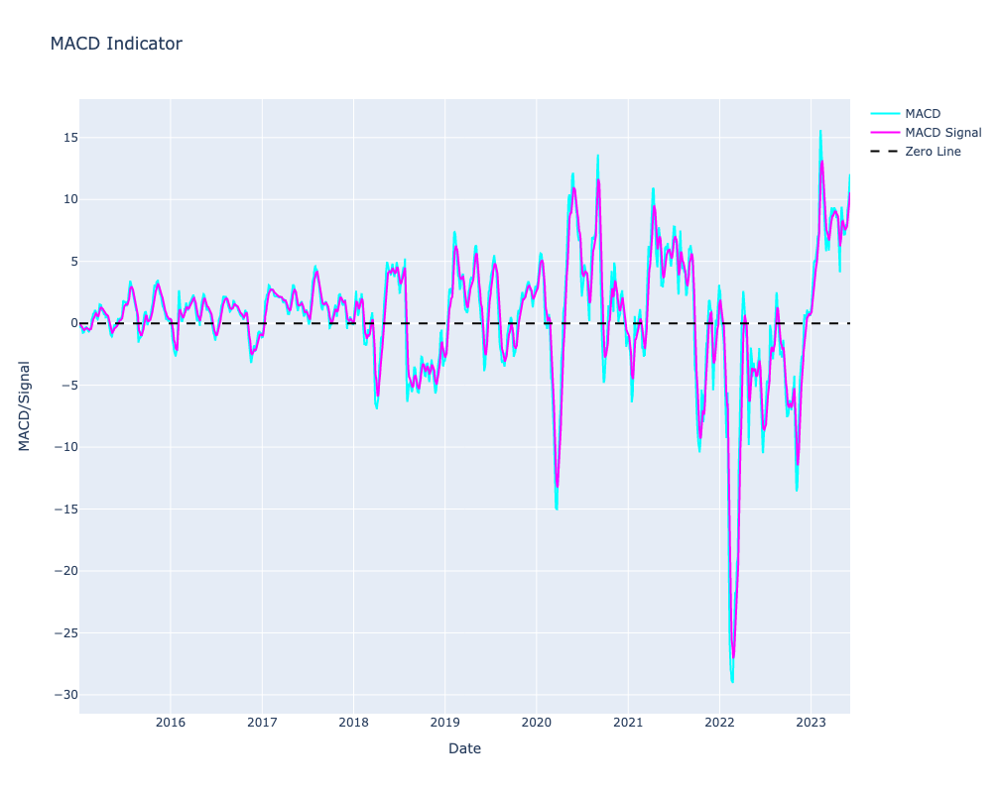

[*********************100%***********************]  1 of 1 completed
Entry Points:
Date: 2015-12-18, Price: 26.51
Date: 2016-01-05, Price: 25.68
Date: 2016-01-25, Price: 24.86
Date: 2016-01-27, Price: 23.35
Date: 2016-05-12, Price: 22.58
Date: 2018-12-21, Price: 37.68
Date: 2019-01-03, Price: 35.55
Date: 2022-06-13, Price: 131.88
Date: 2022-06-16, Price: 130.06
Date: 2022-12-28, Price: 126.04
Date: 2023-01-03, Price: 125.07
Date: 2023-01-05, Price: 125.02

Exit Points:
Date: 2016-09-15, Price: 28.89
Date: 2016-10-10, Price: 29.01
Date: 2016-10-24, Price: 29.41
Date: 2017-02-01, Price: 32.19
Date: 2017-05-08, Price: 38.25
Date: 2017-10-31, Price: 42.26
Date: 2017-11-03, Price: 43.12
Date: 2017-11-16, Price: 42.78
Date: 2017-11-21, Price: 43.28
Date: 2017-12-18, Price: 44.1
Date: 2018-01-17, Price: 44.78
Date: 2018-05-04, Price: 45.96
Date: 2018-06-01, Price: 47.56
Date: 2018-08-01, Price: 50.38
Date: 2018-09-20, Price: 55.01
Date: 2018-09-24, Price: 55.2
Date: 2018-09-27, Price: 56.24
D

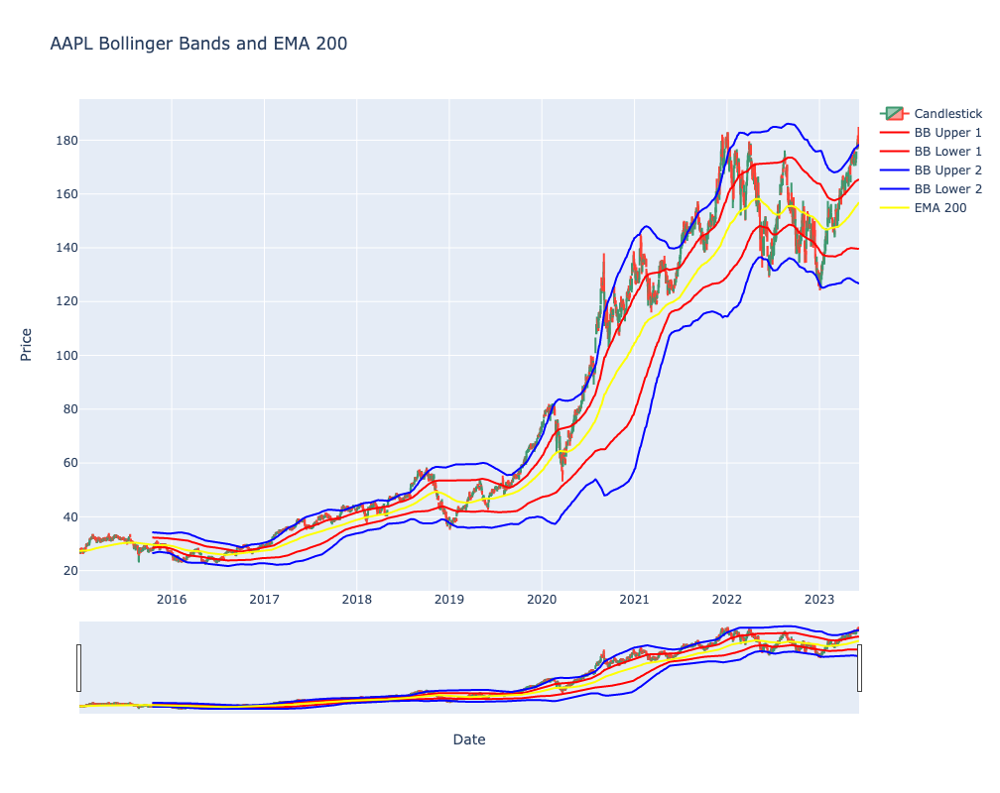

[*********************100%***********************]  1 of 1 completed
Entry Points of SMA:
Date: 2015-04-10, Price: 31.77
Date: 2015-05-21, Price: 32.85
Date: 2015-07-21, Price: 32.69
Date: 2015-12-01, Price: 29.33
Date: 2016-09-15, Price: 28.89
Date: 2016-11-28, Price: 27.89
Date: 2017-05-01, Price: 36.65
Date: 2017-07-14, Price: 37.26
Date: 2017-10-12, Price: 39.0
Date: 2017-12-18, Price: 44.1
Date: 2018-01-11, Price: 43.82
Date: 2018-02-22, Price: 43.12
Date: 2018-04-13, Price: 43.68
Date: 2018-05-08, Price: 46.51
Date: 2018-07-11, Price: 46.97
Date: 2018-10-02, Price: 57.32
Date: 2019-08-21, Price: 53.16
Date: 2020-10-06, Price: 113.16
Date: 2020-11-12, Price: 119.21
Date: 2021-01-25, Price: 142.92
Date: 2021-03-23, Price: 122.54
Date: 2021-04-01, Price: 123.0
Date: 2021-06-14, Price: 130.48
Date: 2021-08-12, Price: 148.89
Date: 2021-10-19, Price: 148.76
Date: 2022-02-07, Price: 171.66
Date: 2022-03-24, Price: 174.07
Date: 2023-03-14, Price: 152.59
Exit Points of SMA:
Date: 2015-10-

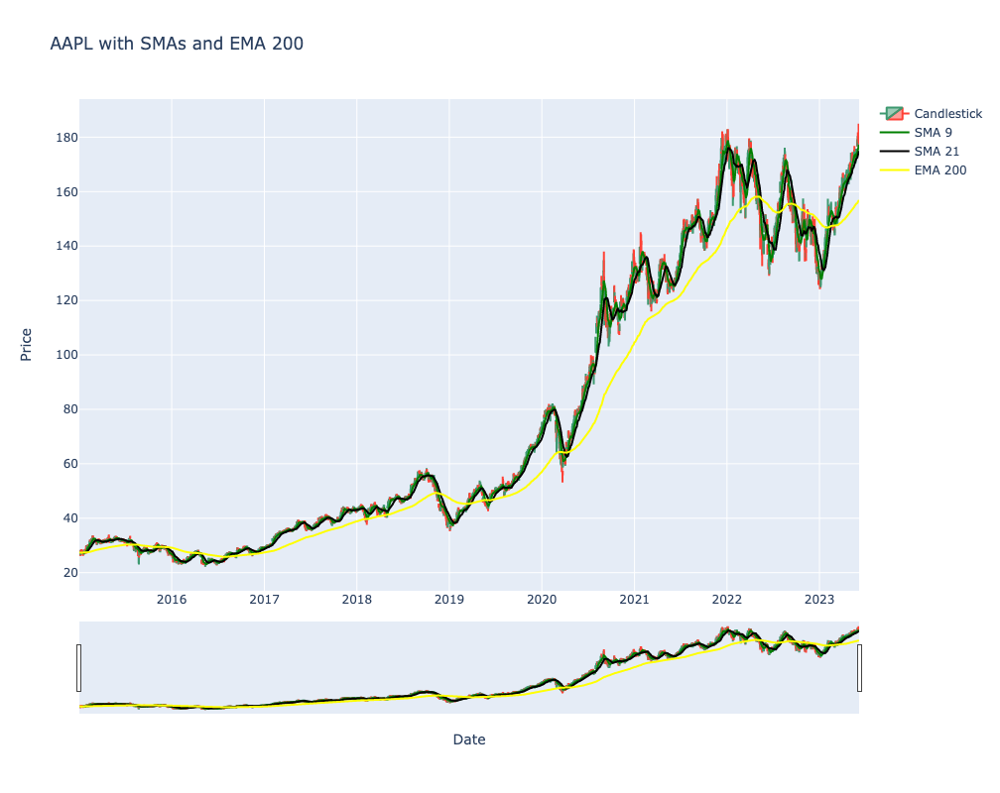

[*********************100%***********************]  1 of 1 completed
Entry Points of MACD:
Date: 2015-01-08, Price: 27.97
Date: 2015-01-22, Price: 28.1
Date: 2015-04-10, Price: 31.77
Date: 2015-04-20, Price: 31.9
Date: 2015-05-18, Price: 32.55
Date: 2015-07-15, Price: 31.7
Date: 2015-08-18, Price: 29.12
Date: 2015-08-28, Price: 28.32
Date: 2015-10-12, Price: 27.9
Date: 2016-01-22, Price: 25.35
Date: 2016-04-14, Price: 28.02
Date: 2016-05-18, Price: 23.64
Date: 2016-07-06, Price: 23.88
Date: 2016-09-15, Price: 28.89
Date: 2016-10-11, Price: 29.08
Date: 2016-11-21, Price: 27.93
Date: 2017-01-09, Price: 29.75
Date: 2017-01-25, Price: 30.47
Date: 2017-05-01, Price: 36.65
Date: 2017-07-10, Price: 36.26
Date: 2017-08-29, Price: 40.73
Date: 2017-10-06, Price: 38.83
Date: 2017-12-18, Price: 44.1
Date: 2018-01-08, Price: 43.59
Date: 2018-02-14, Price: 41.84
Date: 2018-04-10, Price: 43.31
Date: 2018-05-02, Price: 44.14
Date: 2018-06-06, Price: 48.49
Date: 2018-07-09, Price: 47.65
Date: 2018-08-0

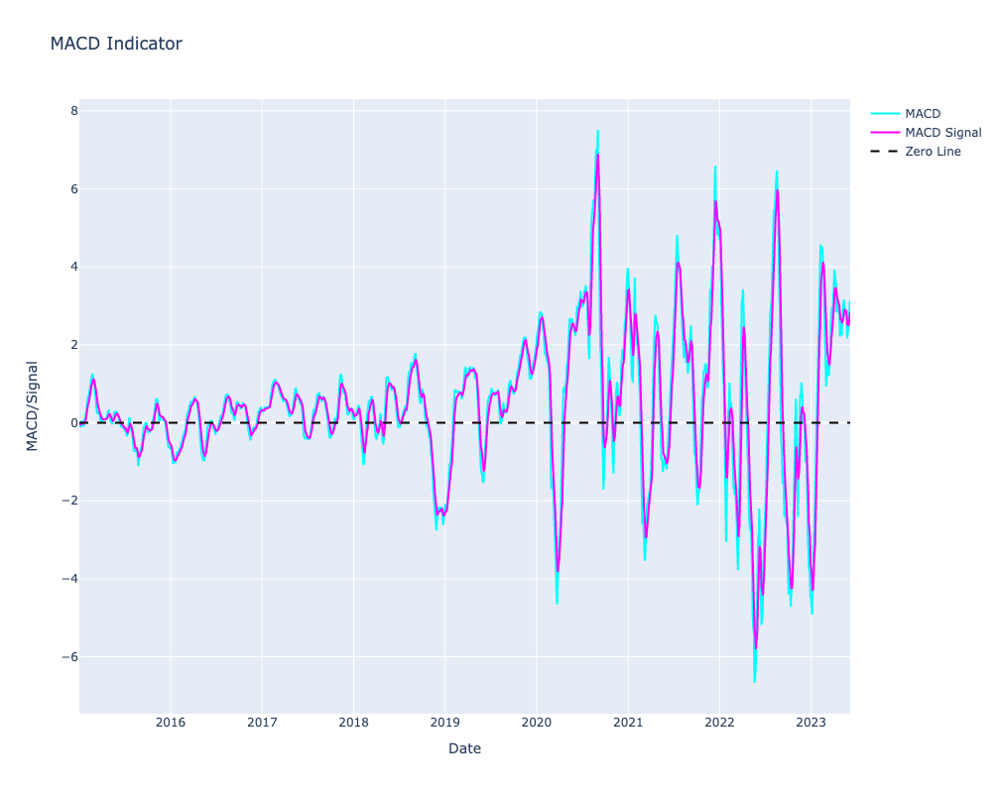

[*********************100%***********************]  1 of 1 completed
Entry Points:
Date: 2018-12-24, Price: 67.2
Date: 2022-01-19, Price: 156.3
Date: 2022-02-23, Price: 144.83
Date: 2022-03-03, Price: 147.9
Date: 2022-03-11, Price: 145.52
Date: 2022-04-26, Price: 139.39
Date: 2022-04-29, Price: 124.28
Date: 2022-06-09, Price: 116.15
Date: 2022-11-02, Price: 92.12

Exit Points:
Date: 2015-10-23, Price: 29.95
Date: 2015-12-08, Price: 33.87
Date: 2016-05-10, Price: 35.15
Date: 2017-02-21, Price: 42.82
Date: 2017-03-29, Price: 43.72
Date: 2017-04-17, Price: 45.1
Date: 2017-06-19, Price: 49.76
Date: 2017-06-21, Price: 50.11
Date: 2017-07-26, Price: 52.64
Date: 2017-10-27, Price: 55.05
Date: 2017-12-05, Price: 57.08
Date: 2017-12-26, Price: 58.84
Date: 2018-01-02, Price: 59.45
Date: 2018-03-26, Price: 77.79
Date: 2018-08-29, Price: 99.9
Date: 2020-01-31, Price: 100.44
Date: 2020-04-13, Price: 108.44
Date: 2020-08-12, Price: 158.11
Date: 2020-08-18, Price: 165.62
Date: 2021-04-28, Price: 172.

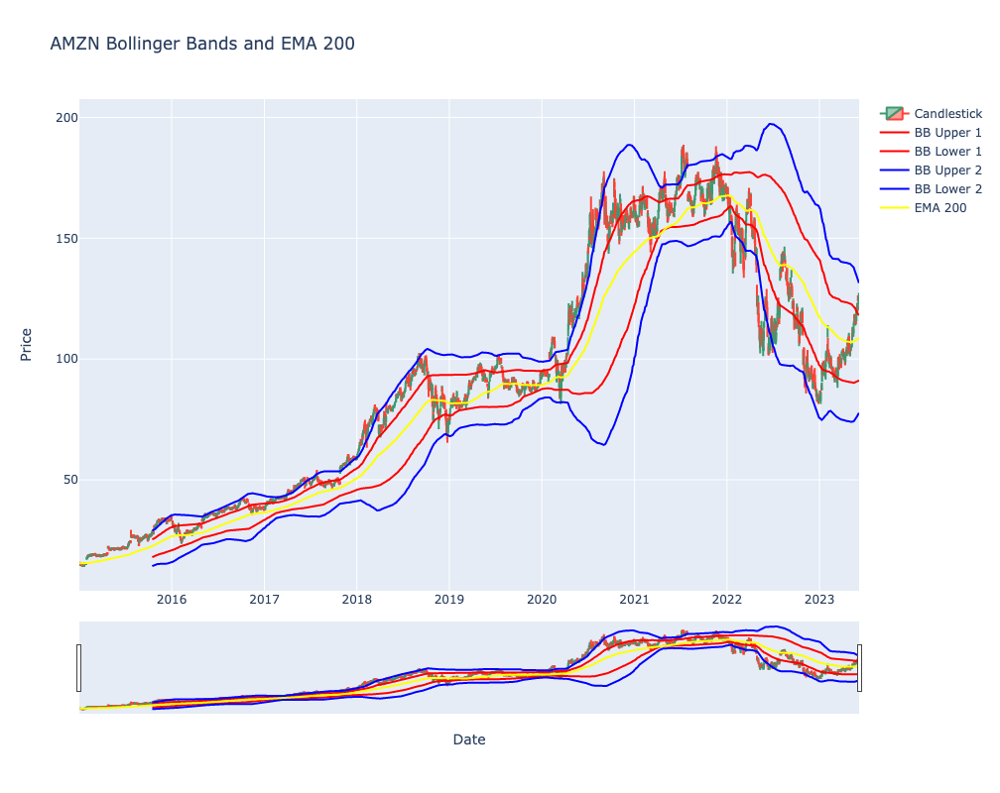

[*********************100%***********************]  1 of 1 completed
Entry Points of SMA:
Date: 2015-04-08, Price: 19.06
Date: 2015-05-27, Price: 21.57
Date: 2015-05-29, Price: 21.46
Date: 2015-06-19, Price: 21.75
Date: 2015-09-11, Price: 26.47
Date: 2015-10-12, Price: 27.51
Date: 2015-12-29, Price: 34.7
Date: 2016-07-07, Price: 36.83
Date: 2016-09-02, Price: 38.62
Date: 2016-11-28, Price: 38.34
Date: 2016-12-09, Price: 38.43
Date: 2016-12-13, Price: 38.72
Date: 2017-01-06, Price: 39.8
Date: 2017-02-16, Price: 42.21
Date: 2017-03-29, Price: 43.72
Date: 2017-06-28, Price: 49.52
Date: 2017-07-17, Price: 50.5
Date: 2017-09-08, Price: 48.29
Date: 2017-10-10, Price: 49.36
Date: 2018-04-20, Price: 76.37
Date: 2018-07-11, Price: 87.75
Date: 2018-10-02, Price: 98.57
Date: 2019-06-17, Price: 94.3
Date: 2019-09-09, Price: 91.57
Date: 2020-02-03, Price: 100.21
Date: 2020-03-27, Price: 95.0
Date: 2020-05-15, Price: 120.49
Date: 2020-08-06, Price: 161.25
Date: 2020-10-05, Price: 159.96
Date: 2020-1

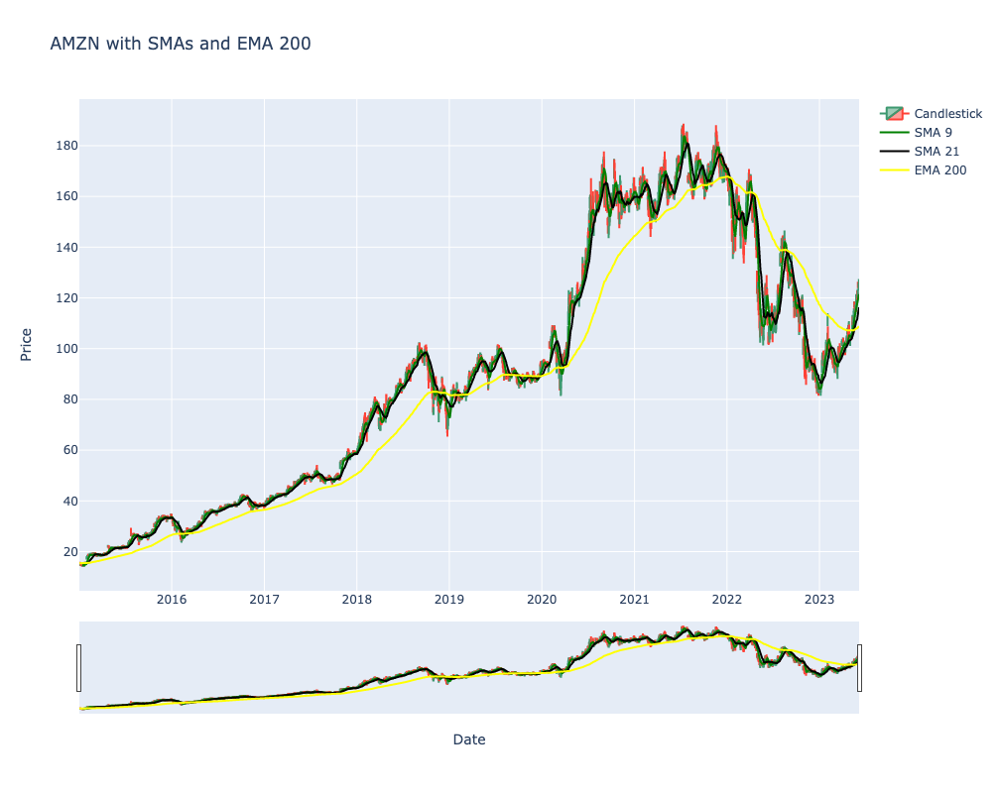

[*********************100%***********************]  1 of 1 completed
Entry Points of MACD:
Date: 2015-01-22, Price: 15.52
Date: 2015-04-09, Price: 19.18
Date: 2015-06-23, Price: 22.3
Date: 2015-07-13, Price: 22.78
Date: 2015-09-10, Price: 26.11
Date: 2015-10-06, Price: 26.87
Date: 2015-12-29, Price: 34.7
Date: 2016-01-28, Price: 31.77
Date: 2016-02-17, Price: 26.7
Date: 2016-03-24, Price: 29.15
Date: 2016-05-02, Price: 34.19
Date: 2016-07-06, Price: 36.88
Date: 2016-07-29, Price: 37.94
Date: 2016-09-06, Price: 39.44
Date: 2016-09-21, Price: 39.49
Date: 2016-11-21, Price: 39.0
Date: 2016-12-05, Price: 37.97
Date: 2017-01-05, Price: 39.02
Date: 2017-02-16, Price: 42.21
Date: 2017-03-29, Price: 43.72
Date: 2017-04-28, Price: 46.25
Date: 2017-05-24, Price: 49.02
Date: 2017-07-12, Price: 50.33
Date: 2017-08-31, Price: 49.03
Date: 2017-10-04, Price: 48.27
Date: 2017-10-27, Price: 55.05
Date: 2017-11-24, Price: 59.3
Date: 2018-01-04, Price: 60.48
Date: 2018-02-21, Price: 74.15
Date: 2018-03-0

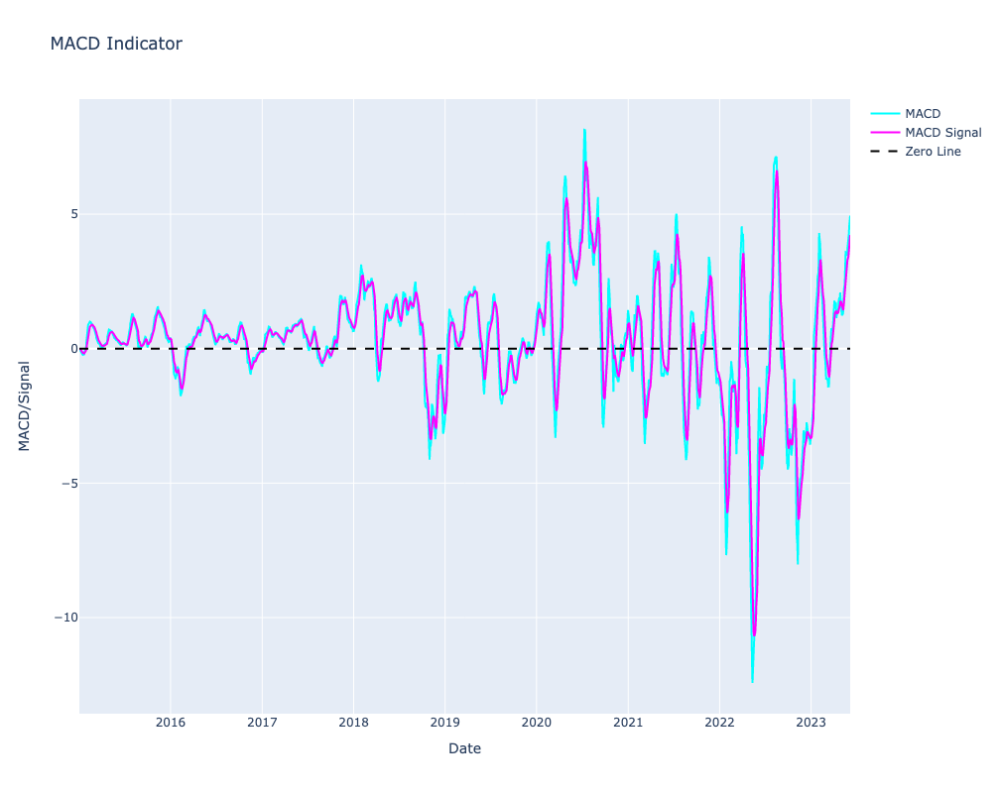

[*********************100%***********************]  1 of 1 completed
Entry Points:
Date: 2018-11-23, Price: 258.82
Date: 2018-12-21, Price: 246.39
Date: 2019-09-24, Price: 254.59
Date: 2019-10-22, Price: 266.69
Date: 2022-01-21, Price: 397.5
Date: 2022-02-03, Price: 405.6
Date: 2022-02-10, Price: 406.27
Date: 2022-02-16, Price: 398.08
Date: 2022-03-02, Price: 380.03
Date: 2022-04-20, Price: 226.19

Exit Points:
Date: 2016-10-18, Price: 118.79
Date: 2016-12-06, Price: 124.57
Date: 2016-12-13, Price: 123.78
Date: 2016-12-15, Price: 125.0
Date: 2016-12-19, Price: 125.45
Date: 2016-12-27, Price: 128.35
Date: 2017-01-04, Price: 129.41
Date: 2017-01-13, Price: 133.7
Date: 2017-07-18, Price: 183.6
Date: 2017-09-21, Price: 188.78
Date: 2017-10-05, Price: 194.39
Date: 2017-10-27, Price: 199.54
Date: 2018-01-08, Price: 212.05
Date: 2018-01-10, Price: 212.52
Date: 2018-04-17, Price: 336.06
Date: 2018-06-13, Price: 379.93
Date: 2018-06-26, Price: 399.39
Date: 2018-07-09, Price: 418.97
Date: 2020-0

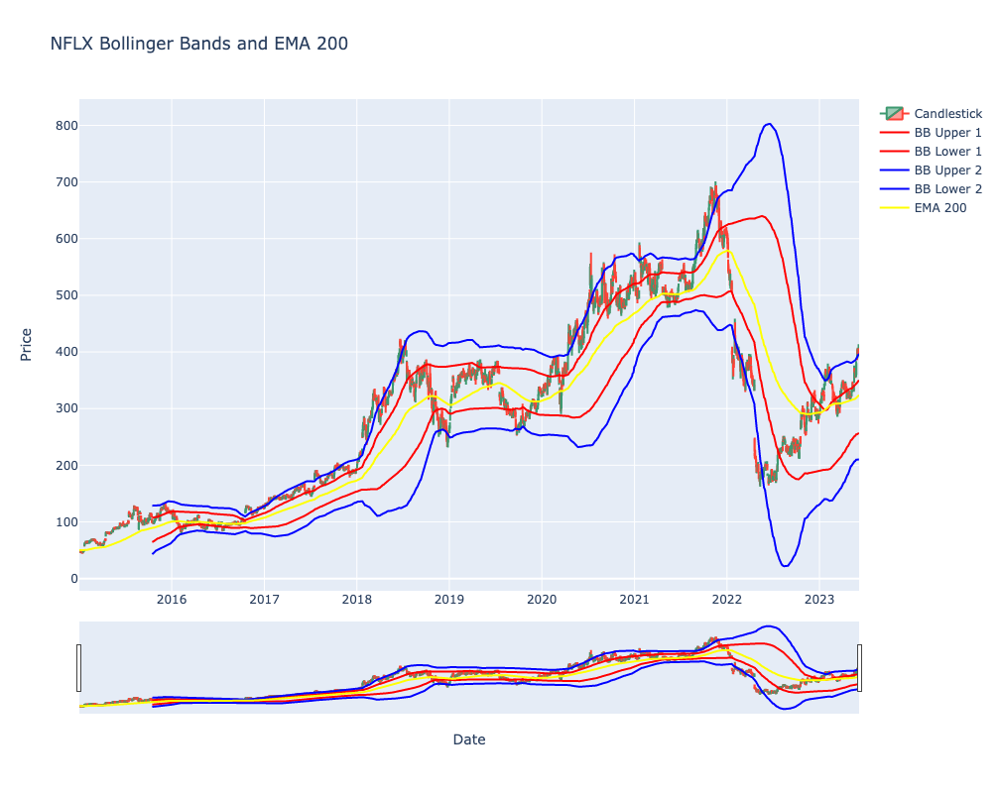

[*********************100%***********************]  1 of 1 completed
Entry Points of SMA:
Date: 2015-04-10, Price: 64.94
Date: 2015-07-13, Price: 101.09
Date: 2015-09-30, Price: 103.26
Date: 2015-11-04, Price: 114.05
Date: 2016-10-05, Price: 106.28
Date: 2016-12-05, Price: 119.16
Date: 2017-03-16, Price: 144.39
Date: 2017-04-27, Price: 153.08
Date: 2017-07-17, Price: 161.7
Date: 2017-09-06, Price: 179.25
Date: 2017-10-06, Price: 198.02
Date: 2017-11-03, Price: 200.01
Date: 2017-12-26, Price: 187.76
Date: 2018-02-22, Price: 278.14
Date: 2018-04-17, Price: 336.06
Date: 2018-05-08, Price: 326.89
Date: 2018-08-29, Price: 368.04
Date: 2019-03-20, Price: 375.22
Date: 2019-04-09, Price: 364.71
Date: 2019-04-24, Price: 374.23
Date: 2019-06-21, Price: 369.21
Date: 2020-03-31, Price: 375.5
Date: 2020-06-17, Price: 447.77
Date: 2020-08-26, Price: 547.53
Date: 2020-10-02, Price: 503.06
Date: 2020-12-02, Price: 503.38
Date: 2021-01-22, Price: 565.17
Date: 2021-03-31, Price: 521.66
Date: 2021-08-17,

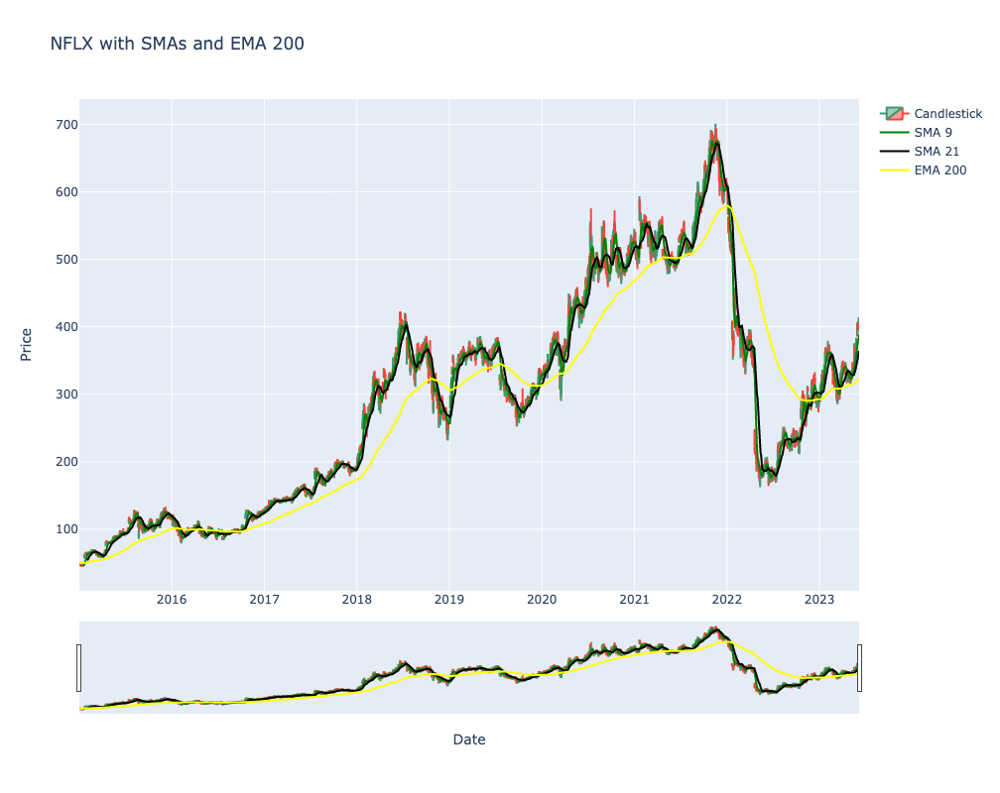

[*********************100%***********************]  1 of 1 completed
Entry Points of MACD:
Date: 2015-01-20, Price: 49.83
Date: 2015-04-08, Price: 63.05
Date: 2015-05-18, Price: 88.27
Date: 2015-06-11, Price: 95.09
Date: 2015-06-16, Price: 95.27
Date: 2015-07-13, Price: 101.09
Date: 2015-07-31, Price: 114.31
Date: 2015-09-18, Price: 102.62
Date: 2015-10-29, Price: 105.12
Date: 2015-11-17, Price: 117.1
Date: 2016-02-12, Price: 87.4
Date: 2016-04-12, Price: 106.98
Date: 2016-05-18, Price: 90.5
Date: 2016-07-01, Price: 96.67
Date: 2016-08-01, Price: 94.37
Date: 2016-10-03, Price: 102.63
Date: 2016-10-18, Price: 118.79
Date: 2016-12-06, Price: 124.57
Date: 2017-01-04, Price: 129.41
Date: 2017-02-08, Price: 144.74
Date: 2017-03-16, Price: 144.39
Date: 2017-03-29, Price: 146.47
Date: 2017-04-25, Price: 152.16
Date: 2017-05-26, Price: 162.43
Date: 2017-07-11, Price: 154.33
Date: 2017-08-31, Price: 174.71
Date: 2017-10-05, Price: 194.39
Date: 2017-12-15, Price: 190.12
Date: 2018-02-23, Price: 

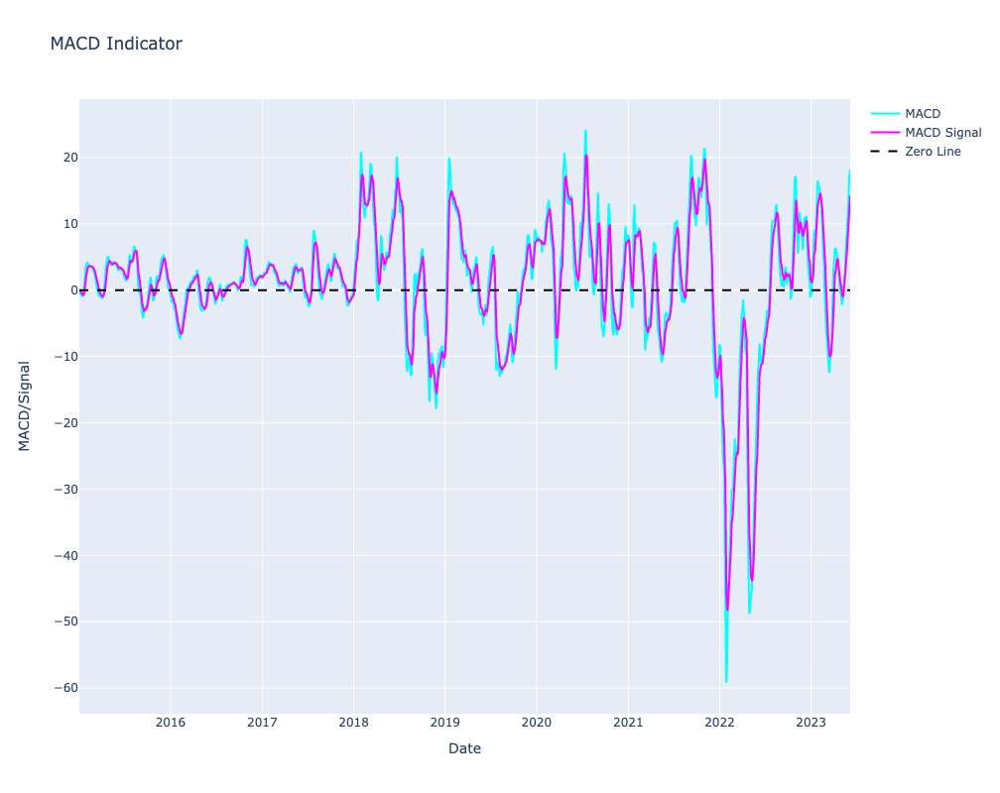

[*********************100%***********************]  1 of 1 completed
Entry Points:
Date: 2022-04-21, Price: 124.94
Date: 2022-06-10, Price: 111.43
Date: 2022-09-30, Price: 96.15
Date: 2022-11-01, Price: 90.5

Exit Points:
Date: 2015-10-23, Price: 35.1
Date: 2016-08-05, Price: 39.11
Date: 2016-10-19, Price: 40.08
Date: 2016-10-24, Price: 40.66
Date: 2017-01-25, Price: 41.78
Date: 2017-04-24, Price: 43.14
Date: 2017-06-19, Price: 47.87
Date: 2017-06-21, Price: 47.97
Date: 2017-06-23, Price: 48.28
Date: 2017-11-03, Price: 51.62
Date: 2017-11-07, Price: 51.67
Date: 2017-11-27, Price: 52.71
Date: 2017-12-15, Price: 53.21
Date: 2018-01-03, Price: 54.12
Date: 2018-02-26, Price: 57.19
Date: 2018-03-09, Price: 58.0
Date: 2018-07-13, Price: 59.44
Date: 2018-07-17, Price: 59.94
Date: 2018-07-23, Price: 60.28
Date: 2018-08-29, Price: 62.47
Date: 2019-04-29, Price: 64.38
Date: 2019-07-26, Price: 62.52
Date: 2019-10-28, Price: 64.5
Date: 2019-11-04, Price: 64.57
Date: 2019-12-05, Price: 66.41
Date: 

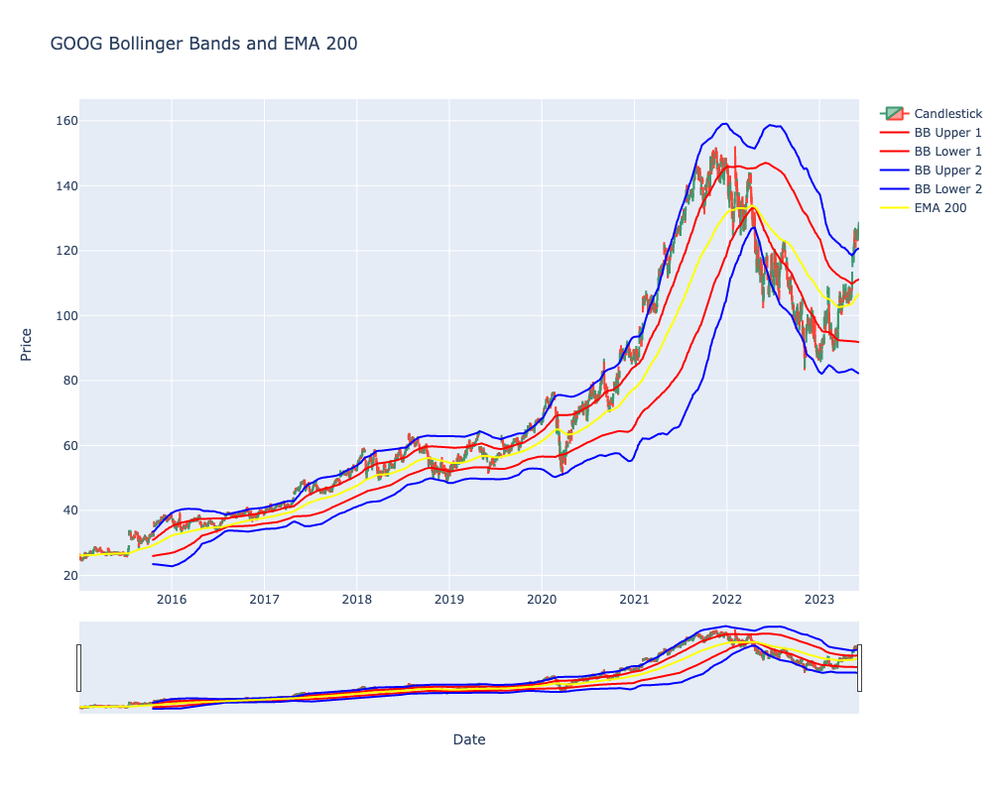

[*********************100%***********************]  1 of 1 completed
Entry Points of SMA:
Date: 2015-04-28, Price: 27.68
Date: 2015-05-27, Price: 26.99
Date: 2015-06-25, Price: 26.76
Date: 2015-09-17, Price: 32.15
Date: 2015-10-09, Price: 32.18
Date: 2015-12-31, Price: 37.94
Date: 2016-02-02, Price: 38.23
Date: 2016-03-02, Price: 35.94
Date: 2016-05-18, Price: 35.33
Date: 2016-07-12, Price: 36.03
Date: 2016-09-23, Price: 39.35
Date: 2016-12-08, Price: 38.82
Date: 2017-01-11, Price: 40.4
Date: 2017-02-16, Price: 41.21
Date: 2017-04-19, Price: 41.91
Date: 2017-07-18, Price: 48.27
Date: 2017-08-31, Price: 46.97
Date: 2017-09-29, Price: 47.96
Date: 2017-12-15, Price: 53.21
Date: 2018-02-27, Price: 55.91
Date: 2018-04-18, Price: 53.6
Date: 2018-05-10, Price: 54.88
Date: 2018-07-13, Price: 59.44
Date: 2018-10-01, Price: 59.77
Date: 2019-03-01, Price: 57.05
Date: 2019-04-09, Price: 59.86
Date: 2019-09-06, Price: 60.25
Date: 2019-10-17, Price: 62.65
Date: 2019-12-06, Price: 67.03
Date: 2020-07

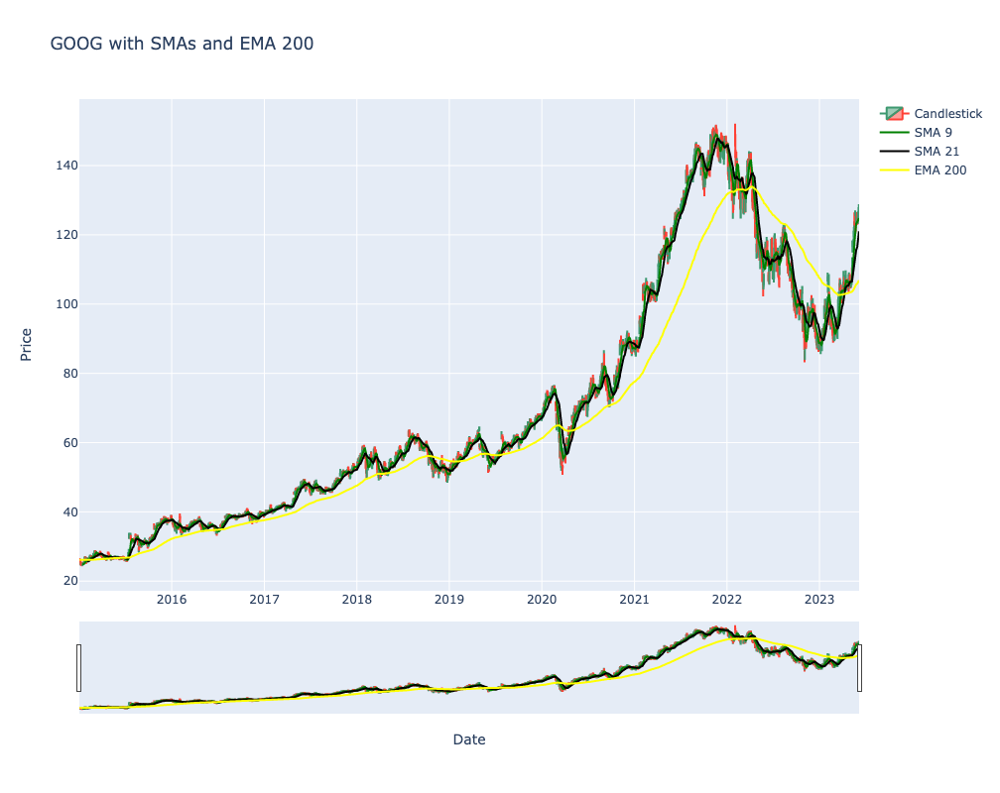

[*********************100%***********************]  1 of 1 completed
Entry Points of MACD:
Date: 2015-01-21, Price: 25.83
Date: 2015-02-26, Price: 27.7
Date: 2015-04-23, Price: 27.28
Date: 2015-05-19, Price: 26.87
Date: 2015-06-18, Price: 26.84
Date: 2015-07-13, Price: 27.33
Date: 2015-09-15, Price: 31.76
Date: 2015-10-05, Price: 32.07
Date: 2015-12-29, Price: 38.83
Date: 2016-01-28, Price: 36.55
Date: 2016-02-19, Price: 35.05
Date: 2016-04-15, Price: 37.95
Date: 2016-05-10, Price: 36.16
Date: 2016-07-05, Price: 34.75
Date: 2016-09-22, Price: 39.36
Date: 2016-10-10, Price: 39.3
Date: 2016-10-18, Price: 39.76
Date: 2016-11-28, Price: 38.41
Date: 2016-12-07, Price: 38.56
Date: 2017-01-06, Price: 40.31
Date: 2017-02-14, Price: 41.02
Date: 2017-03-09, Price: 41.93
Date: 2017-04-18, Price: 41.84
Date: 2017-05-25, Price: 48.48
Date: 2017-07-13, Price: 47.36
Date: 2017-08-23, Price: 46.35
Date: 2017-09-21, Price: 46.62
Date: 2017-09-27, Price: 47.22
Date: 2017-10-30, Price: 50.86
Date: 2017-1

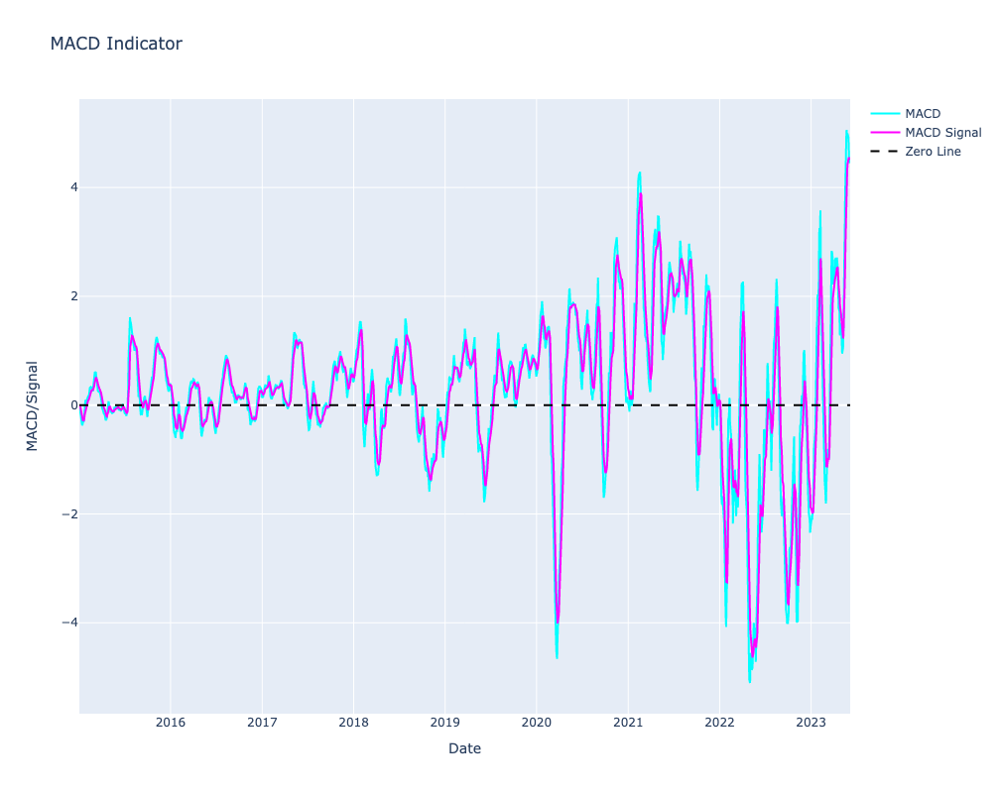

In [9]:
# Import Data from Yahoo Finance
stocks = ['META', 'AAPL', 'AMZN', 'NFLX', 'GOOG']
dfs = {}

start_date = "2016-06-01"
end_date = "2023-06-01"

for stock in stocks:
    dfs[stock] = yf.download(stock, start=start_date, end=end_date)

# Plotting Bollinger Bands and SMAs for each stock
for stock, df in dfs.items():
    plot_bollinger_bands(stock)
    plot_SMA(stock)
    plot_MACD(stock)